<a href="https://colab.research.google.com/github/pandi018/Quality_Assurance-/blob/main/Copy_of_quality_checking_model_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Import all the Dependencies

In [2]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from IPython.display import HTML

In [3]:
BATCH_SIZE = 64
IMAGE_SIZE = 256
CHANNELS=3
EPOCHS=20

### Set all the Constants

### Import data into tensorflow dataset object

In [4]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/drive/MyDrive/Quality_assurance/train",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 1826 files belonging to 2 classes.


In [5]:
class_names = dataset.class_names
class_names

['Defective', 'Non-Defective']

In [6]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(64, 256, 256, 3)
[0 1 1 0 0 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 1 1 1 1 0 0 1 0 1 0 1 0 0 0 1 1 1
 0 1 1 1 0 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0]


As you can see above, each element in the dataset is a tuple. First element is a batch of 16 elements of images. Second element is a batch of 32 elements of class labels 

### Visualize some of the images from our dataset

<ipython-input-8-67dd77015906>:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(3, 4, i + 1)


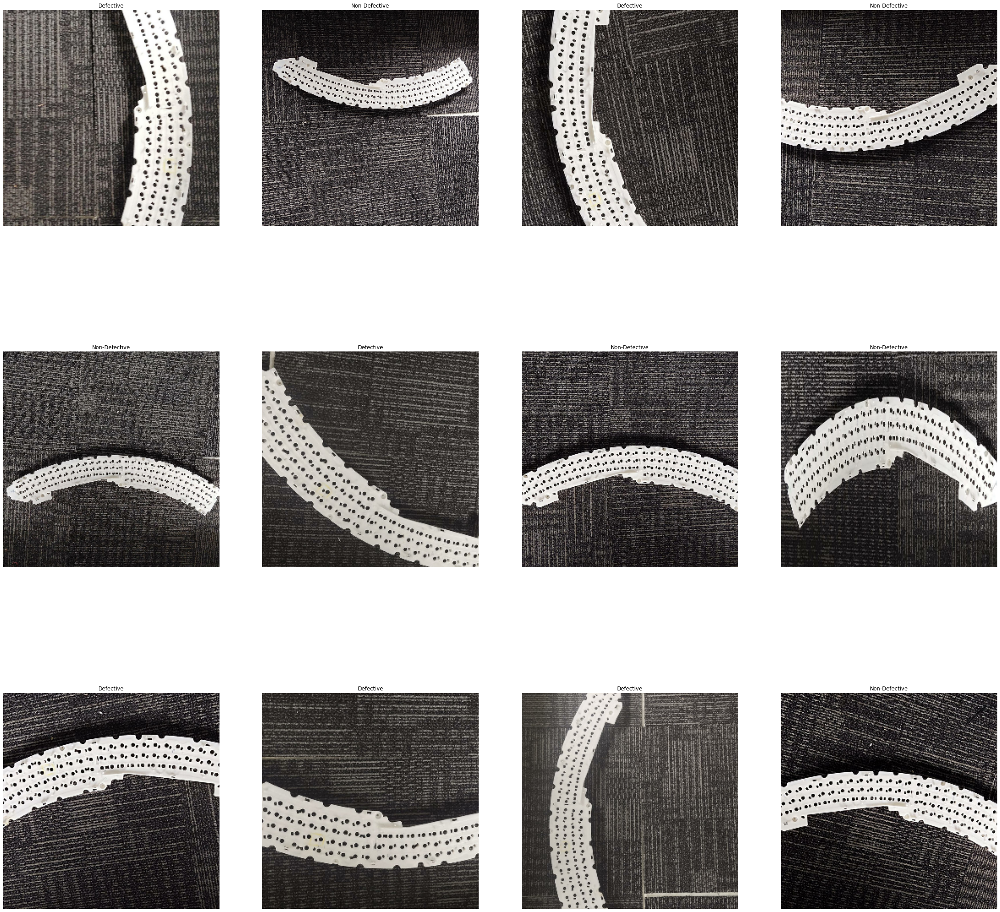

In [8]:
plt.figure(figsize=(40, 40))
for image_batch, labels_batch in dataset.take(2):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

### Function to Split Dataset

Dataset should be bifurcated into 3 subsets, namely:
1. Training: Dataset to be used while training
2. Validation: Dataset to be tested against while training
3. Test: Dataset to be tested against after we trained a model

In [9]:
len(dataset)

29

In [11]:
dataset.class_names

['Defective', 'Non-Defective']

In [12]:
train_size = 0.7
len(dataset)*train_size

20.299999999999997

In [13]:
train_ds = dataset.take(53)
len(train_ds)               #2

29

In [14]:
53+11+11
1215/16

75.9375

In [15]:
test_size=0.15
len(dataset)*test_size

4.35

In [16]:
test_ds = dataset.take(11)
len(test_ds)

11

In [17]:
val_ds = dataset.take(12)
len(val_ds)

12

In [18]:
def get_dataset_partitions_tf(ds, train_split=0.7, val_split=0.2, test_split=0.1, shuffle=True, shuffle_size=100):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [19]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [20]:
len(train_ds)

20

In [21]:
len(val_ds)

5

In [22]:
len(test_ds)

4

### Cache, Shuffle, and Prefetch the Dataset

In [23]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

## Building the Model

### Creating a Layer for Resizing and Normalization
Before we feed our images to network, we should be resizing it to the desired size. 
Moreover, to improve model performance, we should normalize the image pixel value (keeping them in range 0 and 1 by dividing by 256).
This should happen while training as well as inference. Hence we can add that as a layer in our Sequential Model.

You might be thinking why do we need to resize (256,256) image to again (256,256). You are right we don't need to but this will be useful when we are done with the training and start using the model for predictions. At that time somone can supply an image that is not (256,256) and this layer will resize it

In [24]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255),
])

### Data Augmentation
Data Augmentation is needed when we have less data, this boosts the accuracy of our model by augmenting the data.

In [25]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2), 
  layers.experimental.preprocessing.RandomZoom(0.3),
  tf.keras.layers.RandomBrightness(
    0.4, value_range=(0, 255), seed=123
),
tf.keras.layers.RandomContrast(0.4, seed=123),

])

#### Applying Data Augmentation to Train Dataset

In [26]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)



### Model Architecture
We use a CNN coupled with a Softmax activation in the output layer. We also add the initial layers for resizing, normalization and Data Augmentation.

**We are going to use convolutional neural network (CNN) here. CNN is popular for image classification tasks. Watch below video to understand fundamentals of CNN**

In [27]:
input_shape = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

model = models.Sequential([
    layers.InputLayer(input_shape=input_shape),
    layers.Conv2D(32, kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

In [28]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 64)      

### Compiling the Model
We use `adam` Optimizer, `SparseCategoricalCrossentropy` for losses, `accuracy` as a metric

In [29]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=2,
    epochs=60,
)

Epoch 1/60
20/20 - 20s - loss: 0.5299 - accuracy: 0.7296 - val_loss: 0.4976 - val_accuracy: 0.7719 - 20s/epoch - 1s/step
Epoch 2/60
20/20 - 21s - loss: 0.4954 - accuracy: 0.7328 - val_loss: 0.8747 - val_accuracy: 0.5562 - 21s/epoch - 1s/step
Epoch 3/60
20/20 - 20s - loss: 0.4985 - accuracy: 0.7376 - val_loss: 0.5667 - val_accuracy: 0.7156 - 20s/epoch - 1s/step
Epoch 4/60
20/20 - 21s - loss: 0.5002 - accuracy: 0.7368 - val_loss: 0.5367 - val_accuracy: 0.7219 - 21s/epoch - 1s/step
Epoch 5/60
20/20 - 21s - loss: 0.4974 - accuracy: 0.7472 - val_loss: 0.4346 - val_accuracy: 0.8031 - 21s/epoch - 1s/step
Epoch 6/60
20/20 - 21s - loss: 0.5022 - accuracy: 0.7592 - val_loss: 0.5059 - val_accuracy: 0.7875 - 21s/epoch - 1s/step
Epoch 7/60
20/20 - 22s - loss: 0.5024 - accuracy: 0.7408 - val_loss: 0.4150 - val_accuracy: 0.8313 - 22s/epoch - 1s/step
Epoch 8/60
20/20 - 20s - loss: 0.5077 - accuracy: 0.7368 - val_loss: 0.4305 - val_accuracy: 0.8062 - 20s/epoch - 1s/step
Epoch 9/60
20/20 - 21s - loss: 0

In [ ]:
scores = model.evaluate(test_ds)

4/4 [==============================] - 0s 71ms/step - loss: 0.3924 - accuracy: 0.8086


Scores is just a list containing loss and accuracy value

### Plotting the Accuracy and Loss Curves

In [ ]:
history

In [ ]:
history.params

{'verbose': 2, 'epochs': 60, 'steps': 20}

In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

**loss, accuracy, val loss etc are a python list containing values of loss, accuracy etc at the end of each epoch**

In [ ]:
type(history.history['loss'])

list

In [ ]:
len(history.history['loss'])

60

In [ ]:
history.history['loss'][:5] # show loss for first 5 epochs

[0.5299067497253418,
 0.4954446256160736,
 0.49852558970451355,
 0.5002385973930359,
 0.4974018633365631]

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

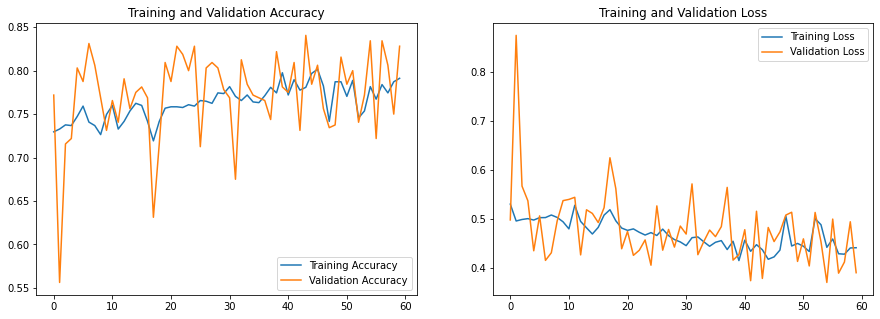

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Run prediction on a sample image

first image to predict
actual label: Non-Defective
2/2 [==============================] - 0s 28ms/step
predicted label: Non-Defective


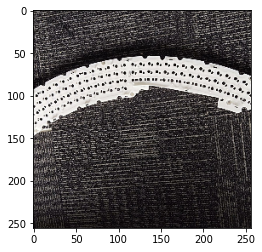

In [ ]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[10].numpy().astype('uint8')
    first_label = labels_batch[10].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

### Write a function for inference

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

**Now run inference on few sample images**

1/1 [==============================] - 0s 27ms/step


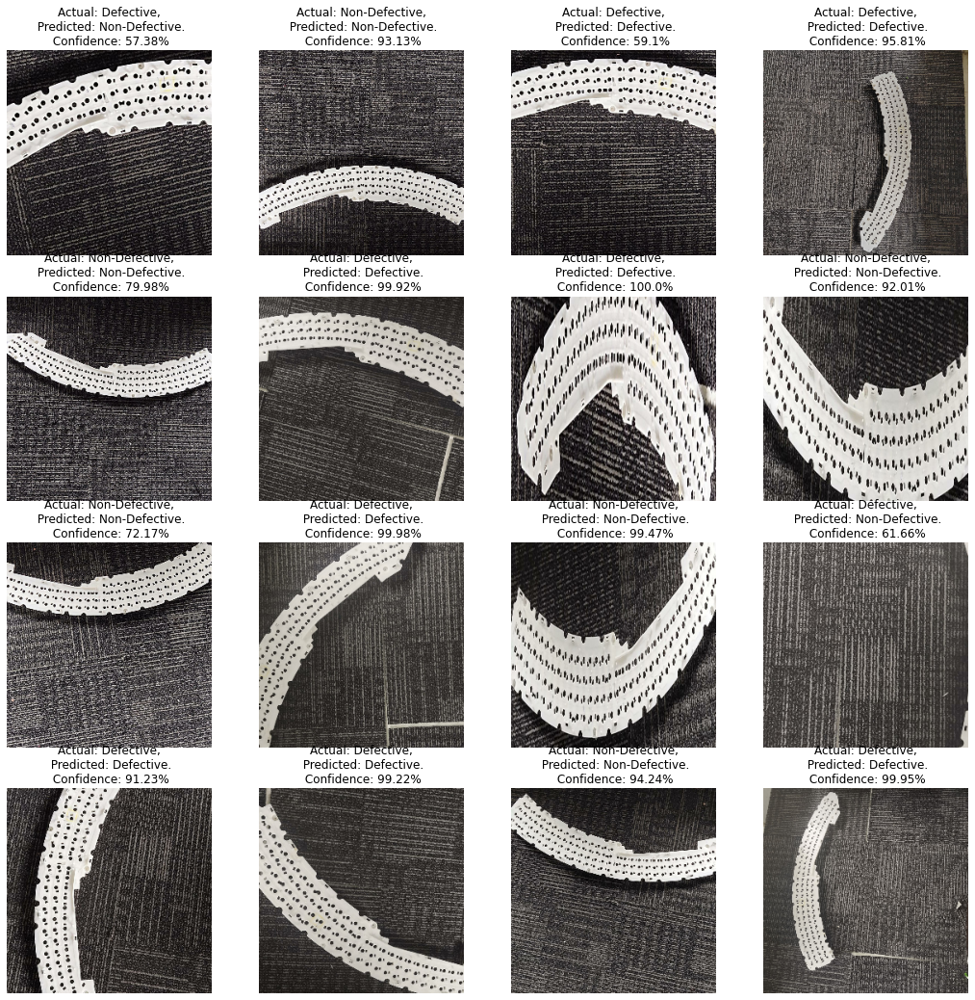

In [ ]:
plt.figure(figsize=(18, 18))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4,4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

### Saving the Model
We append the model to the list of models as a new version

In [ ]:
model.save("../final_img.h5")

In [ ]:
import os
os.getcwd()

'/content'

In [ ]:
os.chdir("/content/drive/MyDrive/Colab Notebooks")

In [30]:
from tensorflow.keras.models import load_model

In [ ]:
from joblib import Parallel, delayed
import joblib
# Save the model as a pickle in a file
joblib.dump(model,'filename.pkl')

# Load the model from the file
# knn_from_joblib = joblib.load('filename.pkl')

# Use the loaded model to make predictions
# knn_from_joblib.predict(X_test)


In [ ]:
# saving and loading the .h5 model

# save model
# model.save('gfgModel.h5')
print('Model Saved!')

In [34]:

# load model
model=load_model('/content/drive/MyDrive/gfgModel (1).h5')
# savedModel.summary()


In [31]:
pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.2/14.2 MB 92.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 KB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 KB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 KB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 KB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.0/107.0 KB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 69.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.3/64.3 KB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.6/80.6 KB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━

In [35]:
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
import gradio as gr
import numpy as np
from PIL import Image
import tensorflow as tf
import cv2
from skimage.feature import match_template
from skimage.feature import peak_local_max

In [36]:
template=cv2.imread('/content/drive/MyDrive/Colab Notebooks/template.jpg',0)

In [37]:
def draw(img):
  print("start")
  img_rgb =cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
  h, w = template.shape[::] 
  predicted_class, confidence = predict_img(img_rgb)
  print(predicted_class)
  if(predicted_class=='Defective'):
     sample_mt = match_template(img_gray,template)
     patch_width, patch_height = patch.shape
     for x, y in peak_local_max(sample_mt, threshold_abs=0.7):
       rect = plt.Rectangle((y, x), patch_height, patch_width, color='r',fc='none')
       img.add_patch(rect) 
     return img,predicted_class
  elif(predicted_class=="Non-defective"):
    return img,predicted_class   
  plt.imshow(img)
  return img

In [38]:
def predict_img(img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2) 
    return predicted_class,confidence

In [39]:
import numpy as np
for images_batch, labels_batch in train_ds.take(6):
    
    first_image = images_batch[1].numpy().astype('uint8')
    first_label = labels_batch[1].numpy()

    predicted_class, confidence = predict_img(images_batch[i].numpy()) 
    # actual_class = class_names[labels[i]]  
    # print(predicted_class,confidence)
    # print(actual_class)
    
    # # print("first image to predict")
    # # plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

1/1 [==============================] - 7s 7s/step
actual label: Defective
2/2 [==============================] - 0s 16ms/step
predicted label: Non-Defective
1/1 [==============================] - 0s 23ms/step
actual label: Non-Defective
2/2 [==============================] - 0s 27ms/step
predicted label: Non-Defective
1/1 [==============================] - 0s 20ms/step
actual label: Non-Defective
2/2 [==============================] - 0s 27ms/step
predicted label: Defective
1/1 [==============================] - 0s 22ms/step
actual label: Non-Defective
2/2 [==============================] - 0s 31ms/step
predicted label: Non-Defective
1/1 [==============================] - 0s 25ms/step
actual label: Non-Defective
2/2 [==============================] - 0s 33ms/step
predicted label: Non-Defective
1/1 [==============================] - 0s 24ms/step
actual label: Defective
2/2 [==============================] - 0s 35ms/step
predicted label: Non-Defective


1/1 [==============================] - 0s 17ms/step


<ipython-input-38-b181e9cce7a9>:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(4,4, i + 1)


1/1 [==============================] - 0s 18ms/step


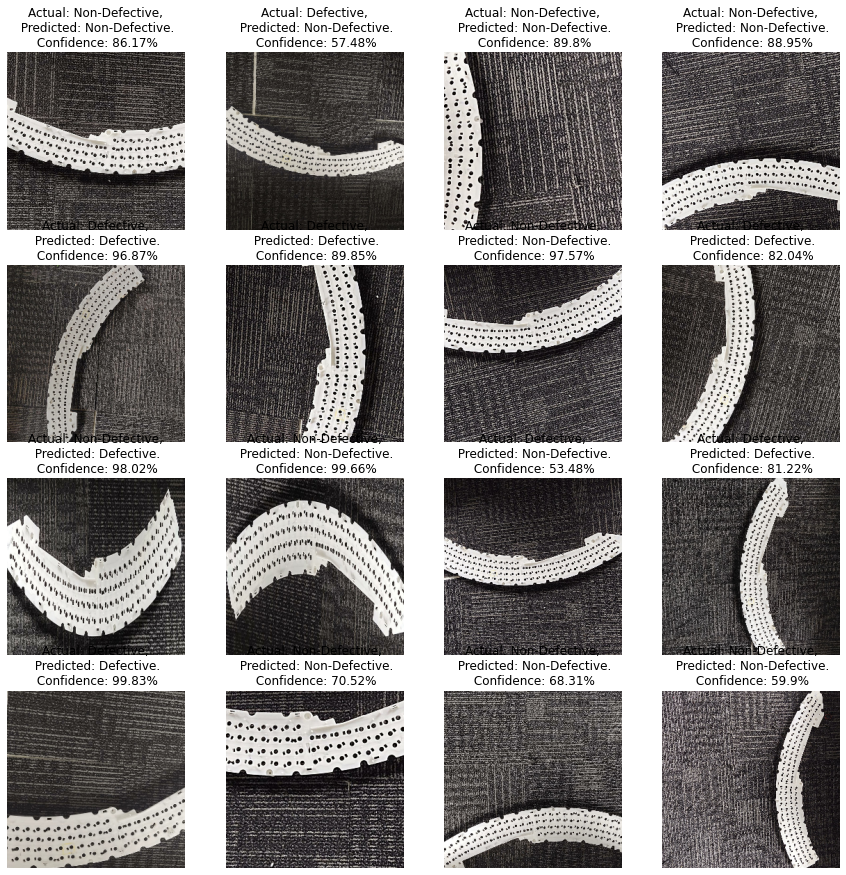

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(16):
    for i in range(16):
        ax = plt.subplot(4,4, i + 1)
        # plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict_img(images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

#UI for an model

In [40]:
!pip install -q gradio 

In [41]:
import cv2
import matplotlib.pyplot as plt
import os

In [42]:
def draw(img,template):
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  res = cv2.matchTemplate(img_gray, template, cv2.TM_SQDIFF)
  # For TM_SQDIFF, Good match yields minimum value; bad match yields large values
  # For all others it is exactly opposite, max value = good fit.
  plt.imshow(res, cmap='gray')
  h, w = template.shape[::] 

  min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

  top_left = min_loc  #Change to max_loc for all except for TM_SQDIFF
  bottom_right = (top_left[0] + w+80, top_left[1] + h+40)

  cv2.rectangle(img, top_left, bottom_right, (255, 0, 255), 5)  #Red rectangle with thickness 2. 
  return img

In [43]:
import gradio as gr
import os

In [44]:
def im(img):
  template = cv2.imread('/content/drive/MyDrive/Colab Notebooks/template.jpg', 0) 
  
  out=draw(img,template)
  return out

In [45]:
def predict_img(img):
    hel=img
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2) 
    if(predicted_class=="Defective"):
      template = cv2.imread('/content/drive/MyDrive/Colab Notebooks/template.jpg', 0) 
      out=draw(img,template)
      return out,predicted_class
    else:
      return hel,predicted_class


In [46]:
image = gr.inputs.Image(shape=(400,400))

/usr/local/lib/python3.8/dist-packages/gradio/inputs.py:257: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)


In [48]:
image = gr.inputs.Image(shape=(400,400))
gr.Interface(fn=predict_img, inputs=image, outputs=["image","text"]).launch(debug=True)

/usr/local/lib/python3.8/dist-packages/gradio/inputs.py:257: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)


Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

Keyboard interruption in main thread... closing server.


KeyboardInterrupt: ignored